**Importing the dataset and libraries**

In [1]:
! pip install -q kaggle
from google.colab import files
files.upload()
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


In [2]:
!kaggle datasets download -d faizalkarim/flood-area-segmentation

 97% 104M/107M [00:03<00:00, 42.2MB/s] 
100% 107M/107M [00:03<00:00, 34.4MB/s]


In [ ]:
!unzip flood-area-segmentation.zip

In [ ]:
!pip install segmentation-models

In [5]:
import os
import numpy as np
import keras
import cv2 as cv
import matplotlib.pyplot as plt
import segmentation_models as sm
from segmentation_models import get_preprocessing
from sklearn.model_selection import train_test_split

Segmentation Models: using `keras` framework.


In [6]:
images_dir = os.listdir("/content/Image")
images_dir.sort()
images_dir = list(images_dir)
images_dir = images_dir[1:]

In [7]:
mask_dir = os.listdir("/content/Mask")
mask_dir.sort()
mask_dir = list(mask_dir)
mask_dir = mask_dir[1:]

In [8]:
images = []
for i in images_dir:
  img = cv.imread(os.path.join("/content/Image",i))
  img_re = cv.resize(img,(256,256))
  images.append(img_re)

In [9]:
masks = []
for i in mask_dir:
  mask = cv.imread(os.path.join("/content/Mask",i),cv.IMREAD_GRAYSCALE)
  mask_re = cv.resize(mask,(256,256))
  masks.append(mask_re)

**Preprocessing**

In [10]:
images = np.array(images)
masks = np.array(masks)

In [11]:
print("images shape" , images.shape)
print("masks shape" , masks.shape)

images shape (289, 256, 256, 3)
masks shape (289, 256, 256)


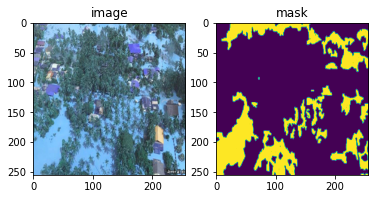

In [12]:
plt.subplot(1,2,1)
plt.title("image")
plt.imshow(images[0])
plt.subplot(1,2,2)
plt.title("mask")
plt.imshow(masks[0])

In [13]:
np.unique(masks)

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

In [14]:
new_mask = np.where(masks>1,1,masks)

In [15]:
np.unique(new_mask)

array([0, 1], dtype=uint8)

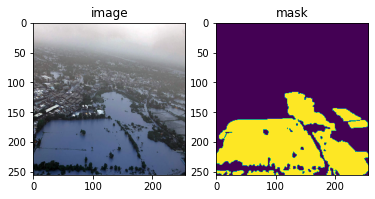

In [16]:
plt.subplot(1,2,1)
plt.title("image")
plt.imshow(images[1])
plt.subplot(1,2,2)
plt.title("mask")
plt.imshow(new_mask[1])

In [17]:
new_mask = new_mask.reshape(289,256,256,1)

**Model Building**

In [18]:
backbone = 'resnet34'
pre_process = get_preprocessing(backbone)
model = sm.Unet(backbone_name=backbone,classes=1,activation='sigmoid',encoder_weights='imagenet')

85521592/85521592 [==============================] - 6s 0us/step


In [19]:
x = pre_process(images)
y = pre_process(new_mask)

In [20]:
x = x/255
y = y/255

In [21]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=444)

In [22]:
print("x train shape" , x_train.shape)
print("y train shape" , y_train.shape)
print("x test shape" , x_test.shape)
print("y test shape" , y_test.shape)

x train shape (231, 256, 256, 3)
y train shape (231, 256, 256, 1)
x test shape (58, 256, 256, 3)
y test shape (58, 256, 256, 1)


In [23]:
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy',sm.metrics.iou_score])

In [24]:
class CustomCallbacks(keras.callbacks.Callback):
  def on_epoch_end(self,epoch,logs={}):
    prediction = model.predict(x_test[0].reshape(1,256,256,3))
    plt.subplot(1,2,1)
    plt.imshow(x_test[0])
    plt.subplot(1,2,2)
    plt.imshow(prediction[0,:,:,0])
    plt.show()

Epoch 1/100
 6/29 [=====>........................] - ETA: 3s - loss: 0.6996 - accuracy: 0.3443 - iou_score: 0.0017

1/1 [==============================] - 1s 1s/step


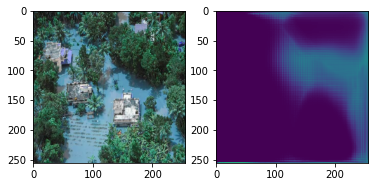

29/29 [==============================] - 26s 361ms/step - loss: 0.4076 - accuracy: 0.5208 - iou_score: 0.0017 - val_loss: 0.1523 - val_accuracy: 0.6108 - val_iou_score: 0.0013
Epoch 2/100
1/1 [==============================] - 0s 39ms/step


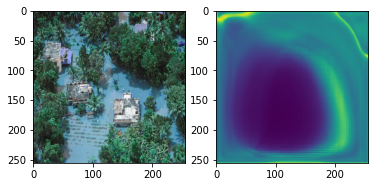

29/29 [==============================] - 5s 180ms/step - loss: 0.1328 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.1728 - val_accuracy: 0.6121 - val_iou_score: 0.0014
Epoch 3/100
1/1 [==============================] - 0s 23ms/step


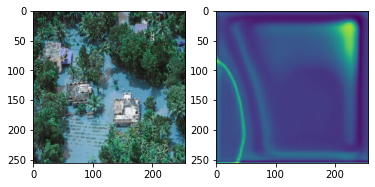

29/29 [==============================] - 5s 173ms/step - loss: 0.0566 - accuracy: 0.5715 - iou_score: 0.0016 - val_loss: 0.1382 - val_accuracy: 0.6121 - val_iou_score: 0.0014
Epoch 4/100
1/1 [==============================] - 0s 21ms/step


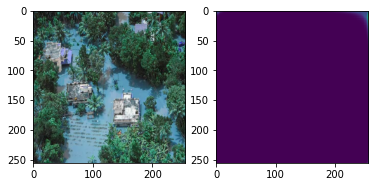

29/29 [==============================] - 5s 170ms/step - loss: 0.0320 - accuracy: 0.5715 - iou_score: 0.0016 - val_loss: 0.2667 - val_accuracy: 0.6121 - val_iou_score: 3.3831e-04
Epoch 5/100
1/1 [==============================] - 0s 21ms/step


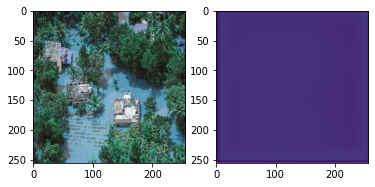

29/29 [==============================] - 5s 169ms/step - loss: 0.0227 - accuracy: 0.5715 - iou_score: 0.0016 - val_loss: 0.0520 - val_accuracy: 0.6121 - val_iou_score: 0.0014
Epoch 6/100
1/1 [==============================] - 0s 32ms/step


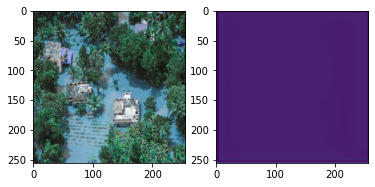

29/29 [==============================] - 5s 175ms/step - loss: 0.0185 - accuracy: 0.5715 - iou_score: 0.0015 - val_loss: 0.0333 - val_accuracy: 0.6121 - val_iou_score: 0.0014
Epoch 7/100
1/1 [==============================] - 0s 21ms/step


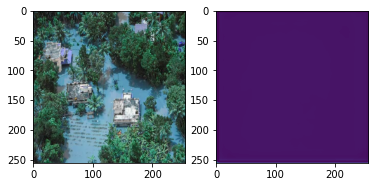

29/29 [==============================] - 5s 177ms/step - loss: 0.0164 - accuracy: 0.5715 - iou_score: 0.0015 - val_loss: 0.0225 - val_accuracy: 0.6121 - val_iou_score: 0.0013
Epoch 8/100
1/1 [==============================] - 0s 23ms/step


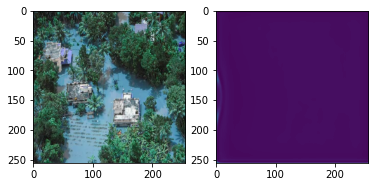

29/29 [==============================] - 5s 173ms/step - loss: 0.0150 - accuracy: 0.5715 - iou_score: 0.0015 - val_loss: 0.0178 - val_accuracy: 0.6121 - val_iou_score: 0.0013
Epoch 9/100
1/1 [==============================] - 0s 21ms/step


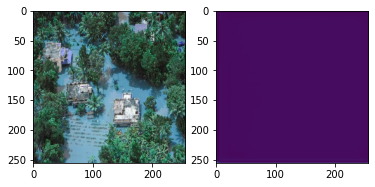

29/29 [==============================] - 5s 175ms/step - loss: 0.0142 - accuracy: 0.5715 - iou_score: 0.0015 - val_loss: 0.0153 - val_accuracy: 0.6121 - val_iou_score: 0.0012
Epoch 10/100
1/1 [==============================] - 0s 21ms/step


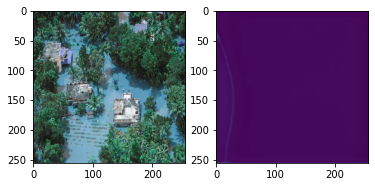

29/29 [==============================] - 5s 173ms/step - loss: 0.0136 - accuracy: 0.5715 - iou_score: 0.0015 - val_loss: 0.0141 - val_accuracy: 0.6121 - val_iou_score: 0.0012
Epoch 11/100
1/1 [==============================] - 0s 45ms/step


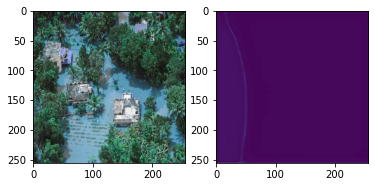

29/29 [==============================] - 5s 185ms/step - loss: 0.0132 - accuracy: 0.5715 - iou_score: 0.0015 - val_loss: 0.0132 - val_accuracy: 0.6121 - val_iou_score: 0.0011
Epoch 12/100
1/1 [==============================] - 0s 22ms/step


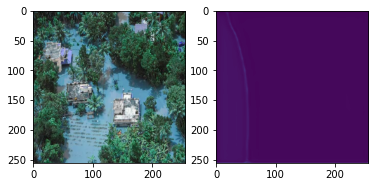

29/29 [==============================] - 5s 186ms/step - loss: 0.0129 - accuracy: 0.5715 - iou_score: 0.0015 - val_loss: 0.0127 - val_accuracy: 0.6121 - val_iou_score: 0.0011
Epoch 13/100
1/1 [==============================] - 0s 20ms/step


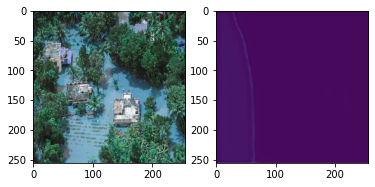

29/29 [==============================] - 5s 175ms/step - loss: 0.0126 - accuracy: 0.5715 - iou_score: 0.0015 - val_loss: 0.0125 - val_accuracy: 0.6121 - val_iou_score: 0.0011
Epoch 14/100
1/1 [==============================] - 0s 20ms/step


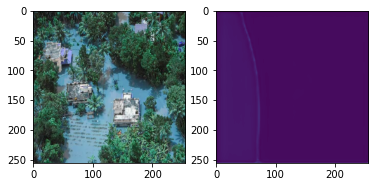

29/29 [==============================] - 5s 177ms/step - loss: 0.0124 - accuracy: 0.5715 - iou_score: 0.0015 - val_loss: 0.0124 - val_accuracy: 0.6121 - val_iou_score: 0.0011
Epoch 15/100
1/1 [==============================] - 0s 22ms/step


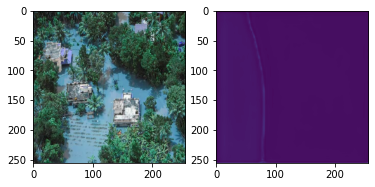

29/29 [==============================] - 5s 176ms/step - loss: 0.0123 - accuracy: 0.5715 - iou_score: 0.0015 - val_loss: 0.0125 - val_accuracy: 0.6121 - val_iou_score: 0.0011
Epoch 16/100
1/1 [==============================] - 0s 21ms/step


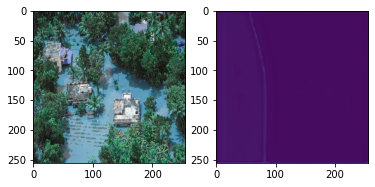

29/29 [==============================] - 5s 187ms/step - loss: 0.0122 - accuracy: 0.5715 - iou_score: 0.0015 - val_loss: 0.0121 - val_accuracy: 0.6121 - val_iou_score: 0.0010
Epoch 17/100
1/1 [==============================] - 0s 23ms/step


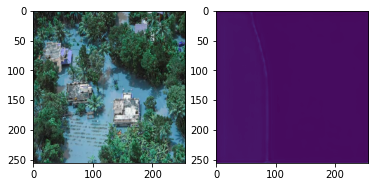

29/29 [==============================] - 5s 183ms/step - loss: 0.0121 - accuracy: 0.5715 - iou_score: 0.0015 - val_loss: 0.0119 - val_accuracy: 0.6121 - val_iou_score: 9.8304e-04
Epoch 18/100
1/1 [==============================] - 0s 45ms/step


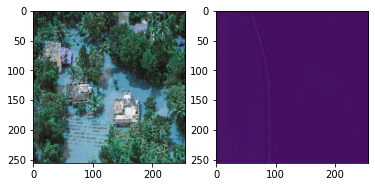

29/29 [==============================] - 6s 192ms/step - loss: 0.0120 - accuracy: 0.5715 - iou_score: 0.0015 - val_loss: 0.0120 - val_accuracy: 0.6121 - val_iou_score: 0.0010
Epoch 19/100
1/1 [==============================] - 0s 32ms/step


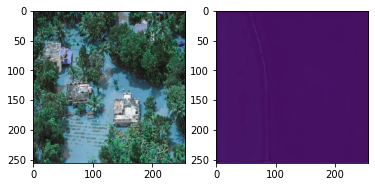

29/29 [==============================] - 5s 176ms/step - loss: 0.0120 - accuracy: 0.5715 - iou_score: 0.0015 - val_loss: 0.0120 - val_accuracy: 0.6121 - val_iou_score: 0.0010
Epoch 20/100
1/1 [==============================] - 0s 22ms/step


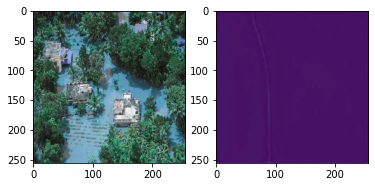

29/29 [==============================] - 5s 174ms/step - loss: 0.0119 - accuracy: 0.5715 - iou_score: 0.0015 - val_loss: 0.0119 - val_accuracy: 0.6121 - val_iou_score: 9.9704e-04
Epoch 21/100
1/1 [==============================] - 0s 21ms/step


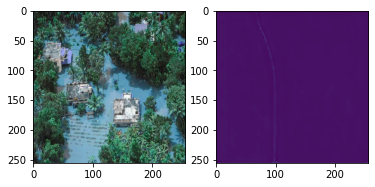

29/29 [==============================] - 5s 175ms/step - loss: 0.0119 - accuracy: 0.5715 - iou_score: 0.0015 - val_loss: 0.0117 - val_accuracy: 0.6121 - val_iou_score: 9.5681e-04
Epoch 22/100
1/1 [==============================] - 0s 22ms/step


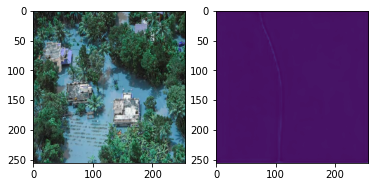

29/29 [==============================] - 5s 174ms/step - loss: 0.0118 - accuracy: 0.5715 - iou_score: 0.0015 - val_loss: 0.0117 - val_accuracy: 0.6121 - val_iou_score: 9.4462e-04
Epoch 23/100
1/1 [==============================] - 0s 21ms/step


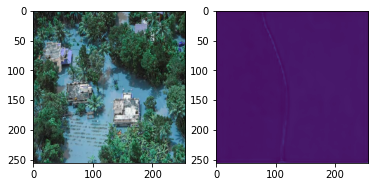

29/29 [==============================] - 5s 176ms/step - loss: 0.0118 - accuracy: 0.5715 - iou_score: 0.0015 - val_loss: 0.0117 - val_accuracy: 0.6121 - val_iou_score: 9.7735e-04
Epoch 24/100
1/1 [==============================] - 0s 28ms/step


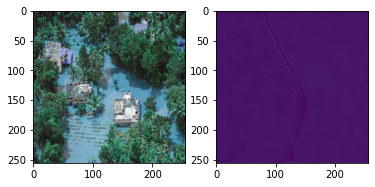

29/29 [==============================] - 5s 174ms/step - loss: 0.0118 - accuracy: 0.5715 - iou_score: 0.0016 - val_loss: 0.0116 - val_accuracy: 0.6121 - val_iou_score: 9.3635e-04
Epoch 25/100
1/1 [==============================] - 0s 36ms/step


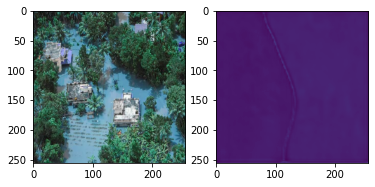

29/29 [==============================] - 5s 189ms/step - loss: 0.0117 - accuracy: 0.5715 - iou_score: 0.0015 - val_loss: 0.0119 - val_accuracy: 0.6121 - val_iou_score: 0.0010
Epoch 26/100
1/1 [==============================] - 0s 20ms/step


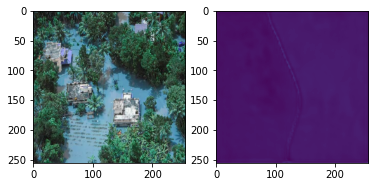

29/29 [==============================] - 5s 176ms/step - loss: 0.0117 - accuracy: 0.5715 - iou_score: 0.0016 - val_loss: 0.0115 - val_accuracy: 0.6121 - val_iou_score: 9.7270e-04
Epoch 27/100
1/1 [==============================] - 0s 21ms/step


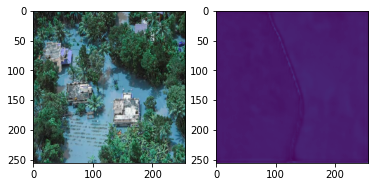

29/29 [==============================] - 5s 175ms/step - loss: 0.0117 - accuracy: 0.5715 - iou_score: 0.0016 - val_loss: 0.0117 - val_accuracy: 0.6121 - val_iou_score: 0.0010
Epoch 28/100
1/1 [==============================] - 0s 22ms/step


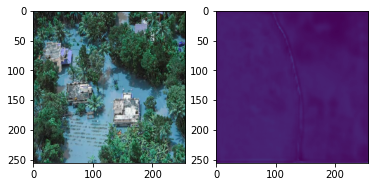

29/29 [==============================] - 5s 176ms/step - loss: 0.0117 - accuracy: 0.5715 - iou_score: 0.0016 - val_loss: 0.0115 - val_accuracy: 0.6121 - val_iou_score: 0.0011
Epoch 29/100
1/1 [==============================] - 0s 22ms/step


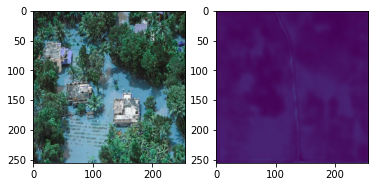

29/29 [==============================] - 5s 185ms/step - loss: 0.0116 - accuracy: 0.5715 - iou_score: 0.0016 - val_loss: 0.0111 - val_accuracy: 0.6121 - val_iou_score: 0.0011
Epoch 30/100
1/1 [==============================] - 0s 39ms/step


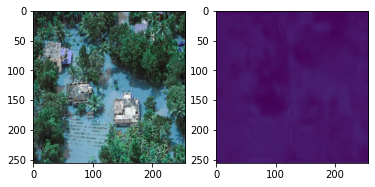

29/29 [==============================] - 5s 182ms/step - loss: 0.0116 - accuracy: 0.5715 - iou_score: 0.0016 - val_loss: 0.0111 - val_accuracy: 0.6121 - val_iou_score: 0.0010
Epoch 31/100
1/1 [==============================] - 0s 21ms/step


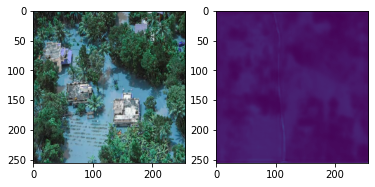

29/29 [==============================] - 5s 176ms/step - loss: 0.0116 - accuracy: 0.5715 - iou_score: 0.0016 - val_loss: 0.0110 - val_accuracy: 0.6121 - val_iou_score: 0.0011
Epoch 32/100
1/1 [==============================] - 0s 32ms/step


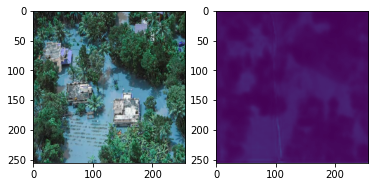

29/29 [==============================] - 5s 181ms/step - loss: 0.0116 - accuracy: 0.5715 - iou_score: 0.0016 - val_loss: 0.0109 - val_accuracy: 0.6121 - val_iou_score: 0.0011
Epoch 33/100
1/1 [==============================] - 0s 21ms/step


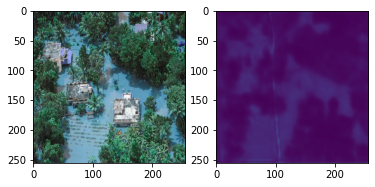

29/29 [==============================] - 5s 179ms/step - loss: 0.0116 - accuracy: 0.5715 - iou_score: 0.0016 - val_loss: 0.0109 - val_accuracy: 0.6121 - val_iou_score: 0.0013
Epoch 34/100
1/1 [==============================] - 0s 21ms/step


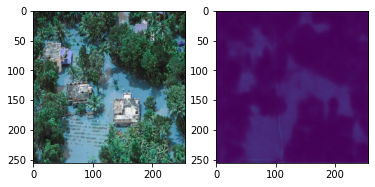

29/29 [==============================] - 5s 176ms/step - loss: 0.0116 - accuracy: 0.5715 - iou_score: 0.0016 - val_loss: 0.0107 - val_accuracy: 0.6121 - val_iou_score: 0.0013
Epoch 35/100
1/1 [==============================] - 0s 22ms/step


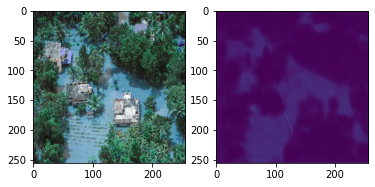

29/29 [==============================] - 5s 177ms/step - loss: 0.0115 - accuracy: 0.5715 - iou_score: 0.0016 - val_loss: 0.0107 - val_accuracy: 0.6121 - val_iou_score: 0.0013
Epoch 36/100
1/1 [==============================] - 0s 20ms/step


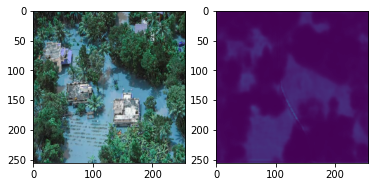

29/29 [==============================] - 5s 186ms/step - loss: 0.0115 - accuracy: 0.5715 - iou_score: 0.0016 - val_loss: 0.0106 - val_accuracy: 0.6121 - val_iou_score: 0.0013
Epoch 37/100
1/1 [==============================] - 0s 36ms/step


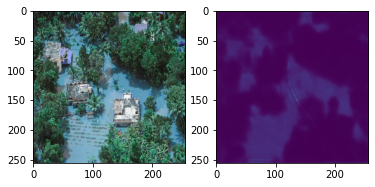

29/29 [==============================] - 5s 181ms/step - loss: 0.0115 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0106 - val_accuracy: 0.6121 - val_iou_score: 0.0014
Epoch 38/100
1/1 [==============================] - 0s 23ms/step


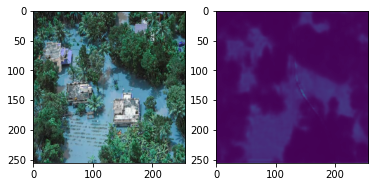

29/29 [==============================] - 5s 178ms/step - loss: 0.0115 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0107 - val_accuracy: 0.6121 - val_iou_score: 0.0014
Epoch 39/100
1/1 [==============================] - 0s 21ms/step


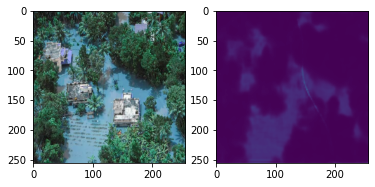

29/29 [==============================] - 5s 175ms/step - loss: 0.0115 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0106 - val_accuracy: 0.6121 - val_iou_score: 0.0013
Epoch 40/100
1/1 [==============================] - 0s 25ms/step


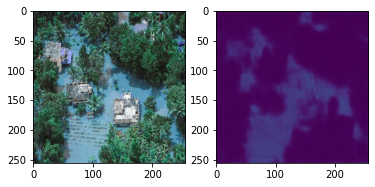

29/29 [==============================] - 5s 188ms/step - loss: 0.0115 - accuracy: 0.5715 - iou_score: 0.0016 - val_loss: 0.0106 - val_accuracy: 0.6121 - val_iou_score: 0.0015
Epoch 41/100
1/1 [==============================] - 0s 25ms/step


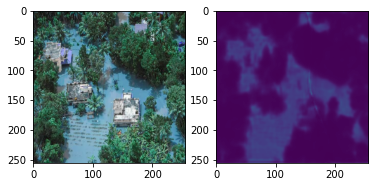

29/29 [==============================] - 5s 176ms/step - loss: 0.0115 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0106 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 42/100
1/1 [==============================] - 0s 36ms/step


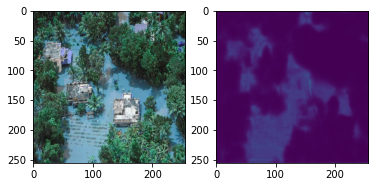

29/29 [==============================] - 5s 181ms/step - loss: 0.0115 - accuracy: 0.5715 - iou_score: 0.0016 - val_loss: 0.0106 - val_accuracy: 0.6121 - val_iou_score: 0.0015
Epoch 43/100
1/1 [==============================] - 0s 22ms/step


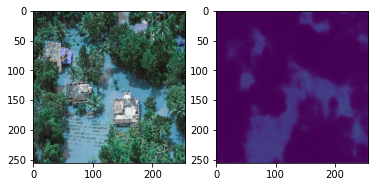

29/29 [==============================] - 5s 187ms/step - loss: 0.0115 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0106 - val_accuracy: 0.6121 - val_iou_score: 0.0015
Epoch 44/100
1/1 [==============================] - 0s 34ms/step


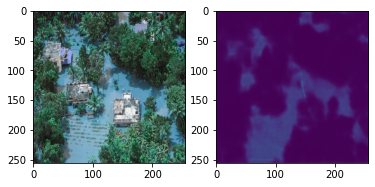

29/29 [==============================] - 5s 181ms/step - loss: 0.0115 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0015
Epoch 45/100
1/1 [==============================] - 0s 21ms/step


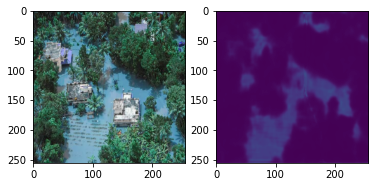

29/29 [==============================] - 5s 176ms/step - loss: 0.0115 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0015
Epoch 46/100
1/1 [==============================] - 0s 22ms/step


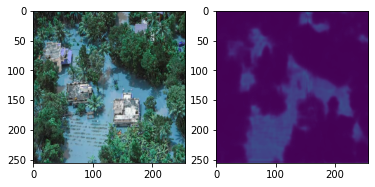

29/29 [==============================] - 5s 185ms/step - loss: 0.0114 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0015
Epoch 47/100
1/1 [==============================] - 0s 22ms/step


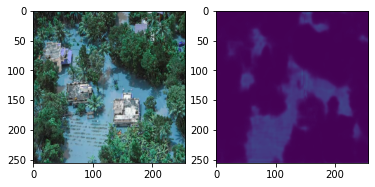

29/29 [==============================] - 5s 188ms/step - loss: 0.0114 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0015
Epoch 48/100
1/1 [==============================] - 0s 23ms/step


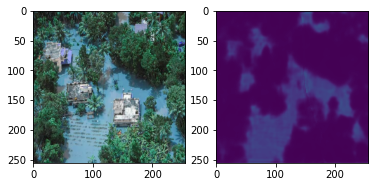

29/29 [==============================] - 5s 187ms/step - loss: 0.0114 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0015
Epoch 49/100
1/1 [==============================] - 0s 36ms/step


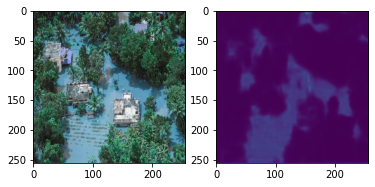

29/29 [==============================] - 5s 184ms/step - loss: 0.0114 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0014
Epoch 50/100
1/1 [==============================] - 0s 21ms/step


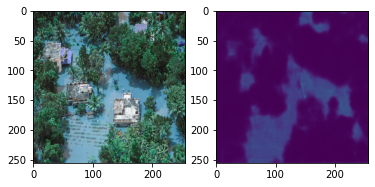

29/29 [==============================] - 5s 176ms/step - loss: 0.0114 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 51/100
1/1 [==============================] - 0s 22ms/step


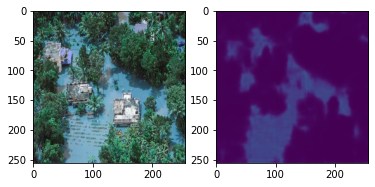

29/29 [==============================] - 5s 177ms/step - loss: 0.0114 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0015
Epoch 52/100
1/1 [==============================] - 0s 22ms/step


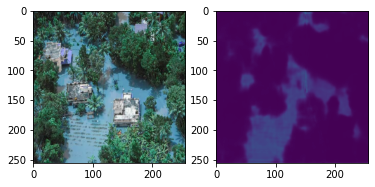

29/29 [==============================] - 5s 177ms/step - loss: 0.0114 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0106 - val_accuracy: 0.6121 - val_iou_score: 0.0014
Epoch 53/100
1/1 [==============================] - 0s 22ms/step


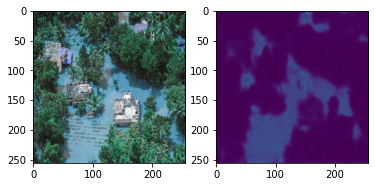

29/29 [==============================] - 5s 189ms/step - loss: 0.0114 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0015
Epoch 54/100
1/1 [==============================] - 0s 21ms/step


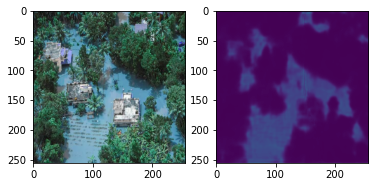

29/29 [==============================] - 5s 179ms/step - loss: 0.0114 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0015
Epoch 55/100
1/1 [==============================] - 0s 22ms/step


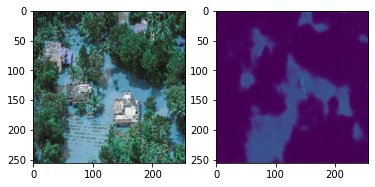

29/29 [==============================] - 5s 177ms/step - loss: 0.0114 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 56/100
1/1 [==============================] - 0s 33ms/step


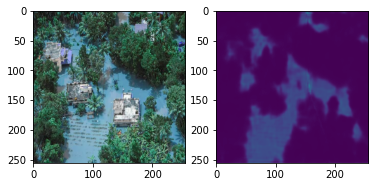

29/29 [==============================] - 5s 182ms/step - loss: 0.0114 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 57/100
1/1 [==============================] - 0s 22ms/step


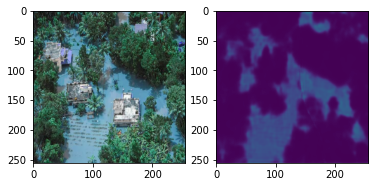

29/29 [==============================] - 5s 177ms/step - loss: 0.0114 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0017
Epoch 58/100
1/1 [==============================] - 0s 28ms/step


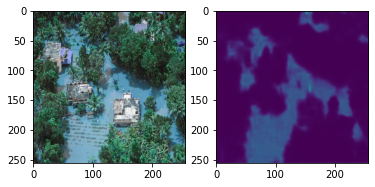

29/29 [==============================] - 5s 187ms/step - loss: 0.0114 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 59/100
1/1 [==============================] - 0s 40ms/step


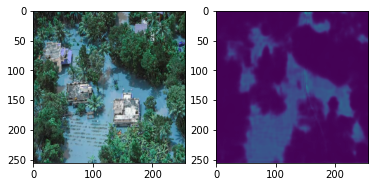

29/29 [==============================] - 5s 183ms/step - loss: 0.0114 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0106 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 60/100
1/1 [==============================] - 0s 22ms/step


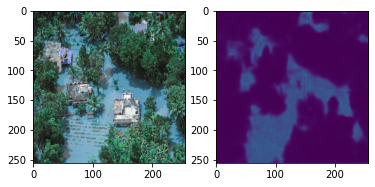

29/29 [==============================] - 5s 178ms/step - loss: 0.0114 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 61/100
1/1 [==============================] - 0s 35ms/step


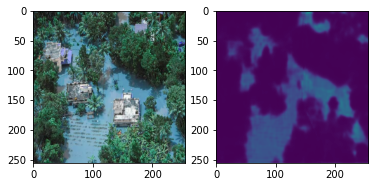

29/29 [==============================] - 5s 184ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0106 - val_accuracy: 0.6121 - val_iou_score: 0.0017
Epoch 62/100
1/1 [==============================] - 0s 22ms/step


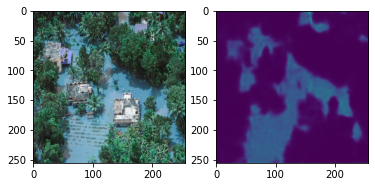

29/29 [==============================] - 5s 176ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0017
Epoch 63/100
1/1 [==============================] - 0s 20ms/step


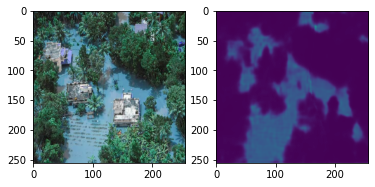

29/29 [==============================] - 5s 177ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 64/100
1/1 [==============================] - 0s 23ms/step


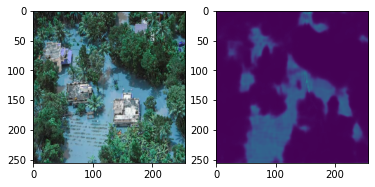

29/29 [==============================] - 5s 178ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0017
Epoch 65/100
1/1 [==============================] - 0s 21ms/step


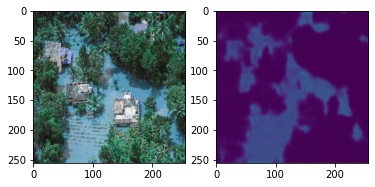

29/29 [==============================] - 5s 187ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0015
Epoch 66/100
1/1 [==============================] - 0s 37ms/step


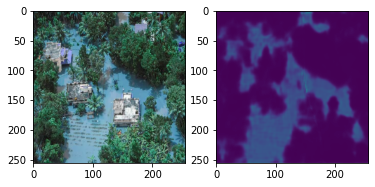

29/29 [==============================] - 5s 187ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0015
Epoch 67/100
1/1 [==============================] - 0s 21ms/step


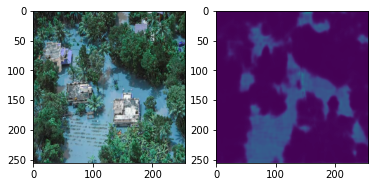

29/29 [==============================] - 5s 187ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0106 - val_accuracy: 0.6121 - val_iou_score: 0.0015
Epoch 68/100
1/1 [==============================] - 0s 34ms/step


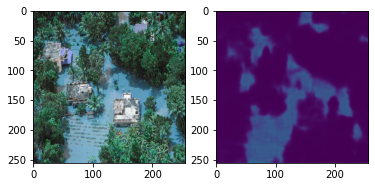

29/29 [==============================] - 5s 181ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0015
Epoch 69/100
1/1 [==============================] - 0s 20ms/step


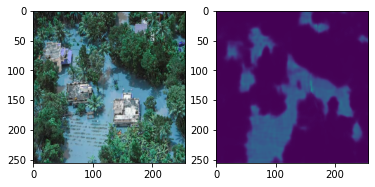

29/29 [==============================] - 5s 179ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 70/100
1/1 [==============================] - 0s 24ms/step


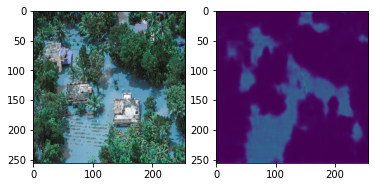

29/29 [==============================] - 5s 179ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 71/100
1/1 [==============================] - 0s 21ms/step


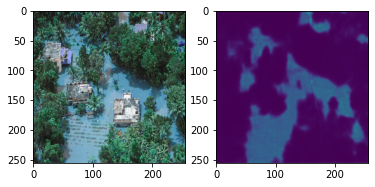

29/29 [==============================] - 5s 180ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 72/100
1/1 [==============================] - 0s 22ms/step


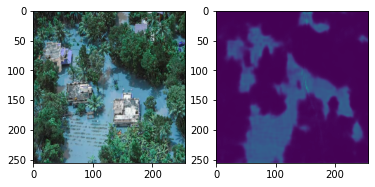

29/29 [==============================] - 5s 178ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0015
Epoch 73/100
1/1 [==============================] - 0s 33ms/step


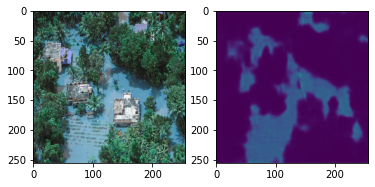

29/29 [==============================] - 5s 182ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0015
Epoch 74/100
1/1 [==============================] - 0s 23ms/step


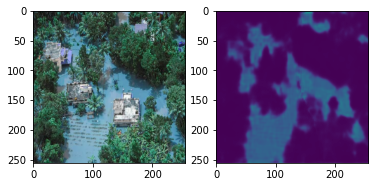

29/29 [==============================] - 5s 188ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 75/100
1/1 [==============================] - 0s 24ms/step


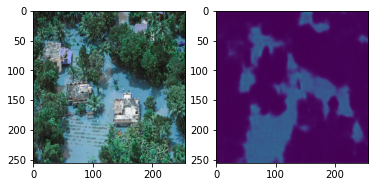

29/29 [==============================] - 5s 178ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0015
Epoch 76/100
1/1 [==============================] - 0s 21ms/step


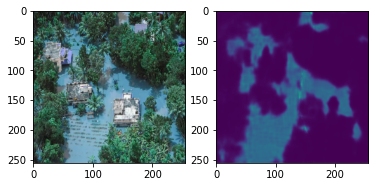

29/29 [==============================] - 5s 178ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0106 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 77/100
1/1 [==============================] - 0s 21ms/step


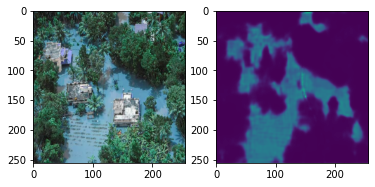

29/29 [==============================] - 5s 178ms/step - loss: 0.0114 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0017
Epoch 78/100
1/1 [==============================] - 0s 34ms/step


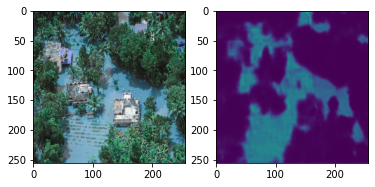

29/29 [==============================] - 5s 184ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0017 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0017
Epoch 79/100
1/1 [==============================] - 0s 22ms/step


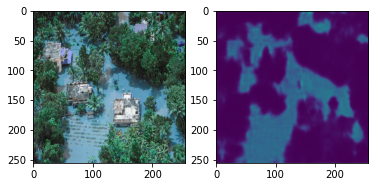

29/29 [==============================] - 5s 177ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 80/100
1/1 [==============================] - 0s 21ms/step


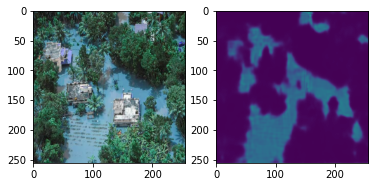

29/29 [==============================] - 5s 187ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 81/100
1/1 [==============================] - 0s 21ms/step


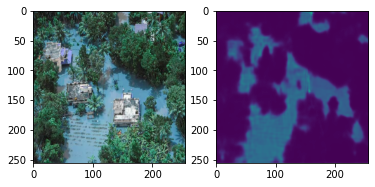

29/29 [==============================] - 5s 178ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 82/100
1/1 [==============================] - 0s 21ms/step


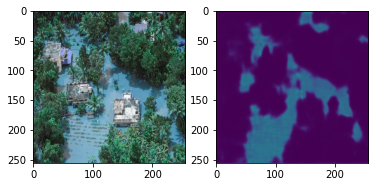

29/29 [==============================] - 5s 177ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 83/100
1/1 [==============================] - 0s 31ms/step


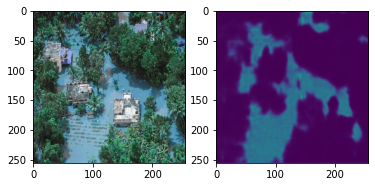

29/29 [==============================] - 5s 181ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0017
Epoch 84/100
1/1 [==============================] - 0s 21ms/step


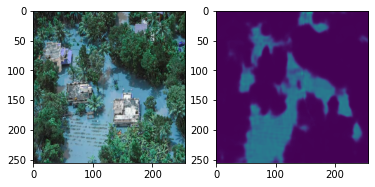

29/29 [==============================] - 5s 178ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0017
Epoch 85/100
1/1 [==============================] - 0s 23ms/step


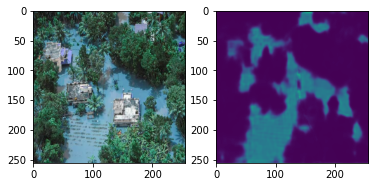

29/29 [==============================] - 5s 179ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0017
Epoch 86/100
1/1 [==============================] - 0s 21ms/step


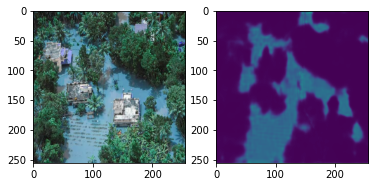

29/29 [==============================] - 5s 181ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 87/100
1/1 [==============================] - 0s 21ms/step


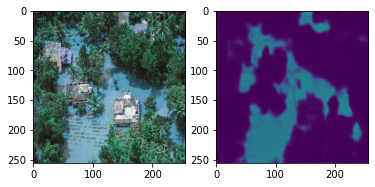

29/29 [==============================] - 5s 177ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0017
Epoch 88/100
1/1 [==============================] - 0s 33ms/step


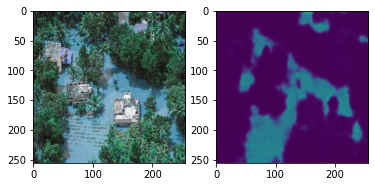

29/29 [==============================] - 6s 193ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0017
Epoch 89/100
1/1 [==============================] - 0s 22ms/step


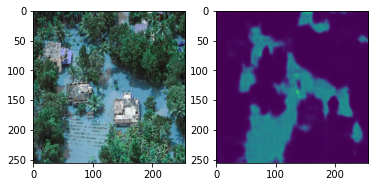

29/29 [==============================] - 5s 178ms/step - loss: 0.0112 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0017
Epoch 90/100
1/1 [==============================] - 0s 22ms/step


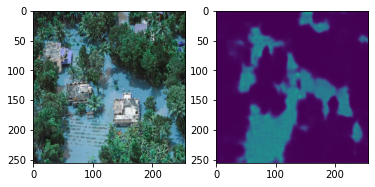

29/29 [==============================] - 5s 179ms/step - loss: 0.0112 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 91/100
1/1 [==============================] - 0s 24ms/step


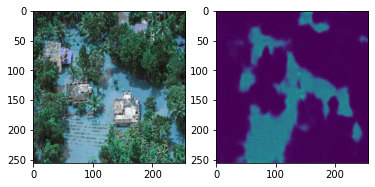

29/29 [==============================] - 5s 180ms/step - loss: 0.0112 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 92/100
1/1 [==============================] - 0s 23ms/step


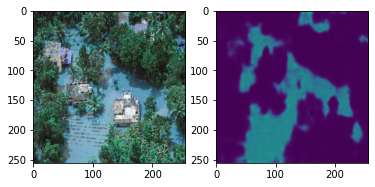

29/29 [==============================] - 5s 178ms/step - loss: 0.0112 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 93/100
1/1 [==============================] - 0s 33ms/step


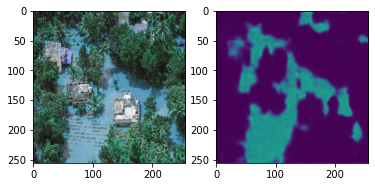

29/29 [==============================] - 5s 183ms/step - loss: 0.0112 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0017
Epoch 94/100
1/1 [==============================] - 0s 21ms/step


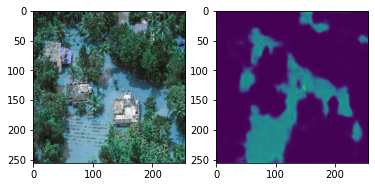

29/29 [==============================] - 5s 179ms/step - loss: 0.0112 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0017
Epoch 95/100
1/1 [==============================] - 0s 32ms/step


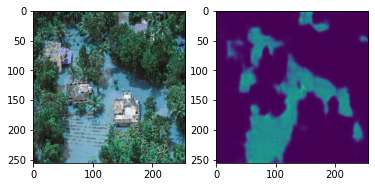

29/29 [==============================] - 5s 179ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0106 - val_accuracy: 0.6121 - val_iou_score: 0.0016
Epoch 96/100
1/1 [==============================] - 0s 20ms/step


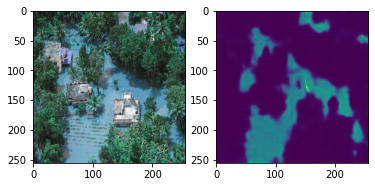

29/29 [==============================] - 5s 181ms/step - loss: 0.0113 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0017
Epoch 97/100
1/1 [==============================] - 0s 21ms/step


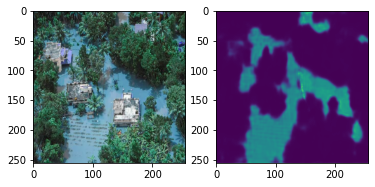

29/29 [==============================] - 5s 178ms/step - loss: 0.0112 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0017
Epoch 98/100
1/1 [==============================] - 0s 43ms/step


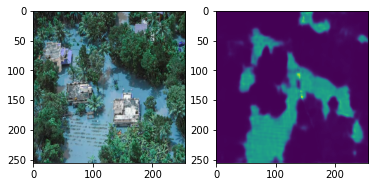

29/29 [==============================] - 5s 181ms/step - loss: 0.0112 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0017
Epoch 99/100
1/1 [==============================] - 0s 20ms/step


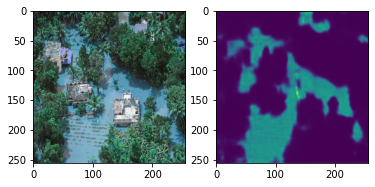

29/29 [==============================] - 5s 179ms/step - loss: 0.0112 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0017
Epoch 100/100
1/1 [==============================] - 0s 22ms/step


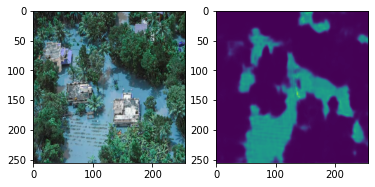

29/29 [==============================] - 5s 188ms/step - loss: 0.0112 - accuracy: 0.5715 - iou_score: 0.0018 - val_loss: 0.0105 - val_accuracy: 0.6121 - val_iou_score: 0.0016


In [25]:
history = model.fit(x_train,y_train , validation_data=(x_test,y_test),batch_size=8,epochs=100,callbacks=[CustomCallbacks()])

**Prediction**

In [26]:
y_pred = model.predict(x_test)

2/2 [==============================] - 4s 2s/step


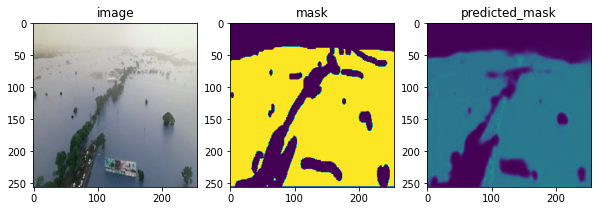

In [28]:
plt.figure(figsize=(10,10))
plt.subplot(1,3,1)
plt.title("image")
plt.imshow(x_test[22])
plt.subplot(1,3,2)
plt.title("mask")
plt.imshow(y_test[22,:,:,0])
plt.subplot(1,3,3)
plt.title("predicted_mask")
plt.imshow(y_pred[22,:,:,0])

In [29]:
from keras.metrics import MeanIoU
iou = MeanIoU(num_classes=2)
iou.update_state(y_test,y_pred)
print("iou score" , iou.result().numpy())

iou score 1.0
